In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import py3Dmol
import glob
sns.set_style('darkgrid')
%cd /net/pulsar/home/koes/jok120/openfold
%matplotlib inline

/net/pulsar/home/koes/jok120/openfold


In [3]:
# Run information
# name: predict-train-01
# training without optimizer steps on sidechainnet minimized structures (scnmin)
# run id: 2y2rizcz
# wandb url: https://wandb.ai/jonathanking/finetune-openfold-01/runs/2y2rizcz
# wandb run dir: out/experiments/230214/wandb/run-20230221_121116-2y2rizcz/files
# slurm id: 18086775
# slurm output: out/18086775_4294967294.out
# output log csv: out/experiments/230214/wandb/run-20230221_121116-2y2rizcz/files/train.csv

In [7]:
# Load csv in pandas
train_csv = "out/experiments/230214/wandb/run-20230221_121116-2y2rizcz/files/train.csv"
df = pd.read_csv(train_csv)
df.sort_values(by='gdcall_aa', ascending=False).head()

,protein_name,distogram,experimentally_resolved,fape,plddt_loss,masked_msa,supervised_chi,violation,openmm_scaled,openmm,...,rmsd_ca,gdtts_ca,gdtha_ca,rmsd_aa,gdcall_aa,tmscore_aa,tmscore_ca,drmsd_aa,lddt_aa,lddtquasi_aa
33729,3tyj_A,0.861885,0.0,0.185397,0.0,1.044518,0.078683,0.037440,0.0,0.0,...,0.338112,0.998162,0.981618,0.945300,0.935483,0.994978,0.994061,0.838823,0.951410,0.951584
38368,3m7u_A,0.778834,0.0,0.194896,0.0,0.736835,0.118385,0.008503,0.0,0.0,...,0.363464,0.998737,0.972222,0.886444,0.932366,0.996111,0.995245,0.729618,0.944000,0.944167
13054,3urc_A,0.727618,0.0,0.177375,0.0,0.706003,0.087906,0.006172,0.0,0.0,...,0.345217,1.000000,0.969697,0.882722,0.925950,0.996192,0.995700,0.748327,0.939482,0.939664
31103,2p3j_A,0.800174,0.0,0.206340,0.0,0.164475,0.104493,0.011698,0.0,0.0,...,0.423213,0.995342,0.947205,0.948125,0.918039,0.995303,0.992174,0.780984,0.941019,0.941202
31177,2xtq_A,0.541779,0.0,0.260933,0.0,0.394470,0.087022,0.005370,0.0,0.0,...,0.382934,0.999023,0.956055,0.758180,0.918033,0.997074,0.995842,0.619119,0.941905,0.942090


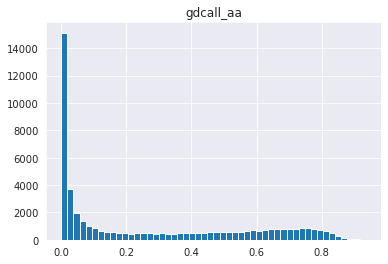

In [5]:
df.hist(column="gdcall_aa", bins=50);

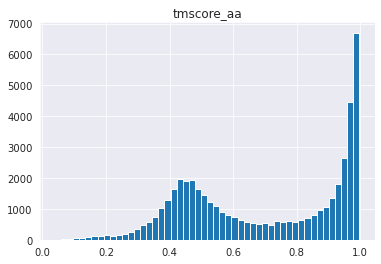

In [6]:
df.hist(column="tmscore_aa", bins=50);

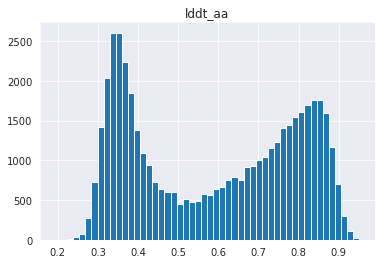

In [7]:
df.hist(column="lddt_aa", bins=50);

In [8]:
# Sort the dataframe by the gdcall_aa column
df_sorted = df.sort_values(by="gdcall_aa")

# Plot the sorted dataframe
df_sorted.head()

,protein_name,distogram,experimentally_resolved,fape,plddt_loss,masked_msa,supervised_chi,violation,openmm_scaled,openmm,...,rmsd_ca,gdtts_ca,gdtha_ca,rmsd_aa,gdcall_aa,tmscore_aa,tmscore_ca,drmsd_aa,lddt_aa,lddtquasi_aa
19967,4u6f_M5,0.776705,0.0,0.958971,0.0,0.000020,0.527187,2.471182,0.0,0.0,...,60.270645,0.000000,0.0,62.025223,0.0,0.108492,0.022580,76.228577,0.443949,0.447952
13300,1qqb_d1qqba1,3.767766,0.0,1.480113,0.0,0.000011,0.652520,0.238330,0.0,0.0,...,13.612591,0.017857,0.0,14.065516,0.0,0.268785,0.042733,12.898355,0.399966,0.403578
30706,3txa_A,1.005907,0.0,0.971363,0.0,0.391992,0.441009,2.409515,0.0,0.0,...,59.439625,0.000000,0.0,59.827549,0.0,0.098794,0.023330,75.166443,0.389334,0.393258
9560,3vlm_d3vlmb2,1.342340,0.0,0.948909,0.0,0.000012,0.398121,1.240272,0.0,0.0,...,43.165310,0.000000,0.0,43.107456,0.0,0.141552,0.033611,48.900864,0.402204,0.404893
5752,1qf7_d1qf7d2,1.079525,0.0,0.972884,0.0,0.000013,0.482125,2.858339,0.0,0.0,...,46.228443,0.000000,0.0,46.476582,0.0,0.140891,0.034630,55.479641,0.371421,0.374815


In [2]:
!ls /net/pulsar/home/koes/jok120/scnmin221013/min/4U6F*_M5*

/net/pulsar/home/koes/jok120/scnmin221013/min/4U6F_51_M5.pdb
/net/pulsar/home/koes/jok120/scnmin221013/min/4U6F_51_M5.pkl
/net/pulsar/home/koes/jok120/scnmin221013/min/4U6F_51_M5.png


In [9]:
!ls /net/pulsar/home/koes/jok120/scnmin221013/min/3TYJ*A*

/net/pulsar/home/koes/jok120/scnmin221013/min/3TYJ_1_A.pdb
/net/pulsar/home/koes/jok120/scnmin221013/min/3TYJ_1_A.pkl
/net/pulsar/home/koes/jok120/scnmin221013/min/3TYJ_1_A.png


In [9]:
PRED_DIR = "out/experiments/230214/wandb/run-20230221_121116-2y2rizcz/files/pdbs/pred"
TRUE_DIR = "out/experiments/230214/wandb/run-20230221_121116-2y2rizcz/files/pdbs/true"

def get_pred_true_filenames(protein_name):
    pred_filename_pattern = f"{PRED_DIR}/pred_*_{protein_name}.pdb"
    true_filename_pattern = f"{TRUE_DIR}/true_*_{protein_name}.pdb"
    # Get the filename by pattern matching with glob
    pred_filename = glob.glob(pred_filename_pattern)[0]
    true_filename = glob.glob(true_filename_pattern)[0]

    prefix = "./"
    
    return prefix + pred_filename, prefix + true_filename

# get_pred_true_filenames("4u6f_M5")

In [10]:
def get_protein_names(df, n=5, start=0):
    for i in range(start, start + n):
        yield df.iloc[i]["protein_name"]

In [16]:
N = 3
START = 2
view = py3Dmol.view(width=1200, height=1400, viewergrid=(N, 3))

for i, protein_name in enumerate(get_protein_names(df_sorted, n=N, start=START)):
    query, chain = protein_name.split("_")
    print(query, chain)

    pdb_filenames = get_pred_true_filenames(protein_name)
    with open(pdb_filenames[0], "r") as f:
        pred_str = f.read()
    with open(pdb_filenames[1], "r") as f:
        true_str = f.read() 

    view.addModel(pred_str, "pdb", viewer=(i, 0))
    view.addModel(true_str, "pdb", viewer=(i, 1))
    view.setStyle({'cartoon':{'color':'spectrum'}}, viewer=(i, 0))
    view.setStyle({'cartoon':{'color':'spectrum'}}, viewer=(i, 1))
    
    # How to add true RCSB structure via chain?
    rcsb_url = f"https://files.rcsb.org/download/{query}.cif"
    print(rcsb_url)
    # download file from url and store as string using requests
    import requests
    rcsb_str = requests.get(rcsb_url).text
    # print(rcsb_str)

    view.addModel(rcsb_str, "cif", viewer=(i, 2))
    # view.addModel(query="pdb:"+query, viewer=(i, 2))
    view.setStyle({'cartoon':{'color':'spectrum'}}, viewer=(i, 2))
    if len(chain) <= 3:
        view.setStyle({'hidden':{}}, viewer=(i, 2))
        view.setStyle({'chain': chain.upper()}, {'cartoon': {'color': 'spectrum'}}, viewer=(i, 2))

view.zoomTo()
view.show()



3txa A
https://files.rcsb.org/download/3txa.cif
3vlm d3vlmb2
https://files.rcsb.org/download/3vlm.cif
1qf7 d1qf7d2
https://files.rcsb.org/download/1qf7.cif


You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol